In [ ]:
import pandas as pd
import nltk
from bertopic import BERTopic
from sklearn.feature_extraction.text import CountVectorizer
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report
from wordcloud import WordCloud
import random
import plotly.express as px

In [ ]:

nltk.download('stopwords')
nltk.download('wordnet')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\PMLS\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\PMLS\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [ ]:

data = pd.read_csv('IMDB Dataset.csv')
data.head()

# Simulate a genre column with random genres (for demonstration purposes)

genres = ['Action', 'Drama', 'Comedy', 'Horror', 'Romance', 'Sci-Fi']
data['genre'] = [random.choice(genres) for _ in range(len(data))]

In [ ]:
# Preprocessing Function (cleaning text data)
def preprocess_text(text):
    import re
    from nltk.corpus import stopwords
    from nltk.stem import WordNetLemmatizer

    text = re.sub(r'<.*?>', '', text)  # Remove HTML tags
    text = re.sub(r'[^\w\s]', '', text)  # Remove punctuation
    text = re.sub(r'\d+', '', text)  # Remove numbers
    text = text.lower()  # Convert to lowercase
    stop_words = set(stopwords.words('english'))
    text = " ".join(word for word in text.split() if word not in stop_words)
    lemmatizer = WordNetLemmatizer()
    text = " ".join([lemmatizer.lemmatize(word) for word in text.split()])
    return text


In [ ]:

data['cleaned_review'] = data['review'].apply(preprocess_text)

In [ ]:

topic_model = BERTopic(
    vectorizer_model=CountVectorizer(stop_words="english"),  # Use CountVectorizer with English stopwords
    verbose=True
)

In [ ]:

topics, probs = topic_model.fit_transform(data['cleaned_review'])

2024-12-27 14:35:39,253 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/1563 [00:00<?, ?it/s]

2024-12-27 15:16:30,913 - BERTopic - Embedding - Completed ✓
2024-12-27 15:16:30,955 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-12-27 15:17:15,104 - BERTopic - Dimensionality - Completed ✓
2024-12-27 15:17:15,173 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-12-27 15:17:29,569 - BERTopic - Cluster - Completed ✓
2024-12-27 15:17:29,767 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-12-27 15:17:40,665 - BERTopic - Representation - Completed ✓


In [ ]:
# Add topics to the DataFrame
data['topic'] = topics

In [ ]:
# Topic Naming and Interpretation
topic_labels = {}
for topic in topic_model.get_topic_info()['Topic']:  # Access 'Topic' column instead of 'topic'
    if topic == -1:
        continue
    words = ", ".join([word[0] for word in topic_model.get_topic(topic)])
    topic_labels[topic] = f"Topic {topic}: {words}"

# Map topic labels to the dataset
data['topic_label'] = data['topic'].map(topic_labels)

topic_model.visualize_barchart(top_n_topics=10)


In [ ]:
# Topic-Genre Relationship
topic_genre_dist = data.groupby(['topic_label', 'genre']).size().unstack(fill_value=0)
topic_genre_dist_normalized = topic_genre_dist.div(topic_genre_dist.sum(axis=1), axis=0)


In [ ]:
# Plot Topic-Genre Relationship (Interactive)
fig = px.bar(
    topic_genre_dist_normalized,
    barmode='stack',
    title="Topic Distribution Across Genres",
    labels={'value': 'Proportion', 'topic_label': 'Topic'},
    height=600,
)
fig.update_layout(xaxis={'categoryorder': 'total descending'})
fig.show()

In [ ]:
# Map Topics to Dominant Genres
dominant_genre_per_topic = topic_genre_dist.idxmax(axis=1)
data['predicted_genre'] = data['topic_label'].map(dominant_genre_per_topic)

In [ ]:
# Convert both 'genre' and 'predicted_genre' columns to strings
data['genre'] = data['genre'].astype(str)
data['predicted_genre'] = data['predicted_genre'].astype(str)

# Classification Report for Genre Prediction
print("Genre Prediction Report:")
print(classification_report(data['genre'], data['predicted_genre'], zero_division=0))


Genre Prediction Report:
              precision    recall  f1-score   support

      Action       0.24      0.14      0.17      8396
      Comedy       0.25      0.11      0.15      8352
       Drama       0.26      0.08      0.12      8400
      Horror       0.23      0.09      0.13      8357
     Romance       0.24      0.08      0.12      8263
      Sci-Fi       0.25      0.07      0.11      8232
         nan       0.00      0.00      0.00         0

    accuracy                           0.09     50000
   macro avg       0.21      0.08      0.12     50000
weighted avg       0.24      0.09      0.13     50000



Index(['Topic', 'Count', 'Name', 'Representation', 'Representative_Docs'], dtype='object')
Topic                                                                 -1
Count                                                              30499
Name                                              -1_movie_film_like_bad
Representation         [movie, film, like, bad, good, time, character...
Representative_Docs    [come eerie uncanny little crime film sort rev...
Name: 0, dtype: object
Topic                                                                  0
Count                                                                838
Name                                                0_worst_seen_ive_bad
Representation         [worst, seen, ive, bad, horrible, terrible, aw...
Representative_Docs    [movie definitely worst movie ive seen entire ...
Name: 1, dtype: object
Topic                                                                  1
Count                                                       

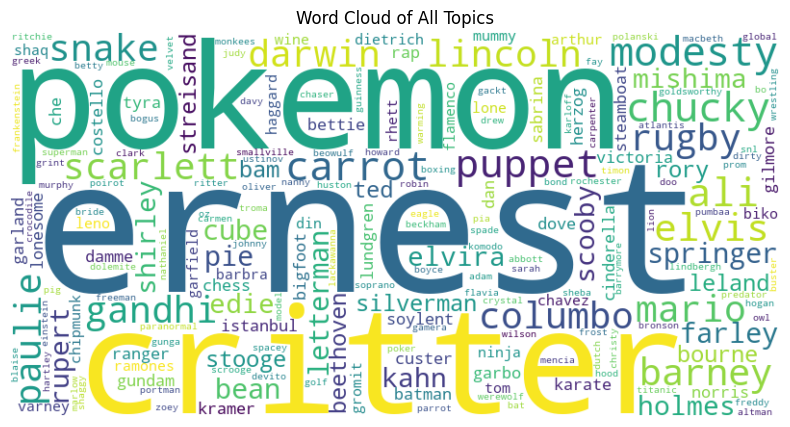

In [ ]:

topic_info = topic_model.get_topic_info()

# Check column names to understand the structure of the DataFrame
print(topic_info.columns)

# Combine words from all topics (excluding outliers)
combined_words = {}
for _, row in topic_info.iterrows():
    print(row)
    topic = row['Topic']  # Update with the correct column name
    if topic == -1:  # Skip outliers
        continue
    words = dict(topic_model.get_topic(topic))
    combined_words.update(words)  # Combine words from each topic


wc = WordCloud(background_color="white", width=800, height=400)
wc.generate_from_frequencies(combined_words)

plt.figure(figsize=(10, 5))
plt.imshow(wc, interpolation="bilinear")
plt.axis("off")
plt.title("Word Cloud of All Topics")
plt.show()


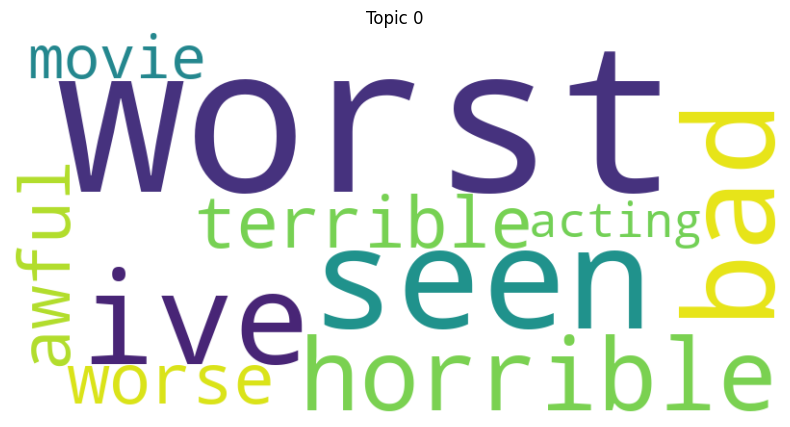

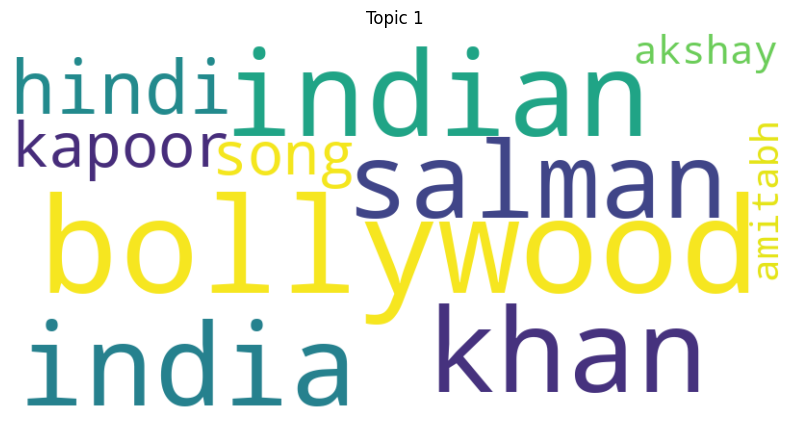

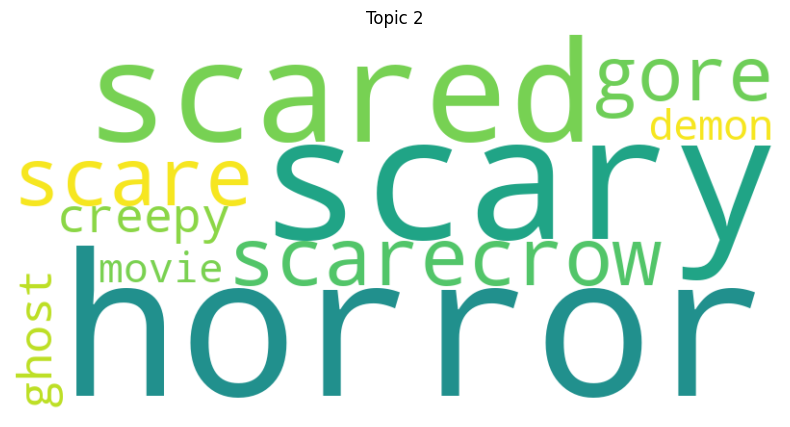

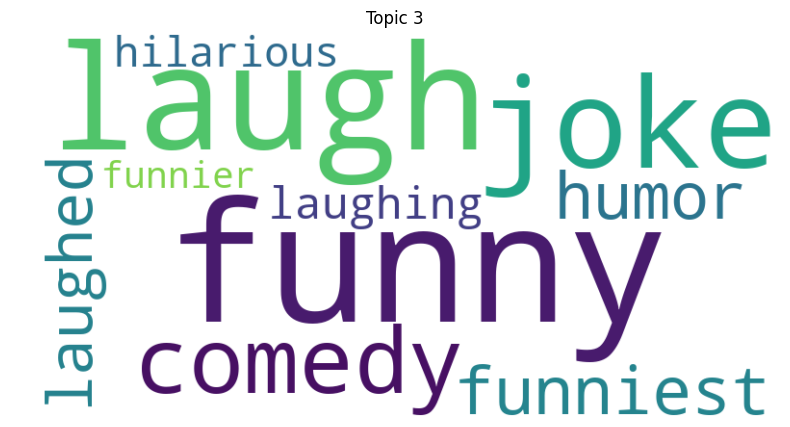

In [ ]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud


topic_info = topic_model.get_topic_info()

# Limit the number of topics to 5 (excluding outliers)
topics_to_plot = topic_info.head(5)

# Plot word clouds for each of the top 10 topics
for _, row in topics_to_plot.iterrows():
    topic = row['Topic']  # Update with the correct column name if necessary
    if topic == -1:  # Skip outliers
        continue
    words = dict(topic_model.get_topic(topic))

    # Generate a word cloud from the words of this topic
    wc = WordCloud(background_color="white", width=800, height=400)
    wc.generate_from_frequencies(words)


    plt.figure(figsize=(10, 5))
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.title(f"Topic {topic}")
    plt.show()


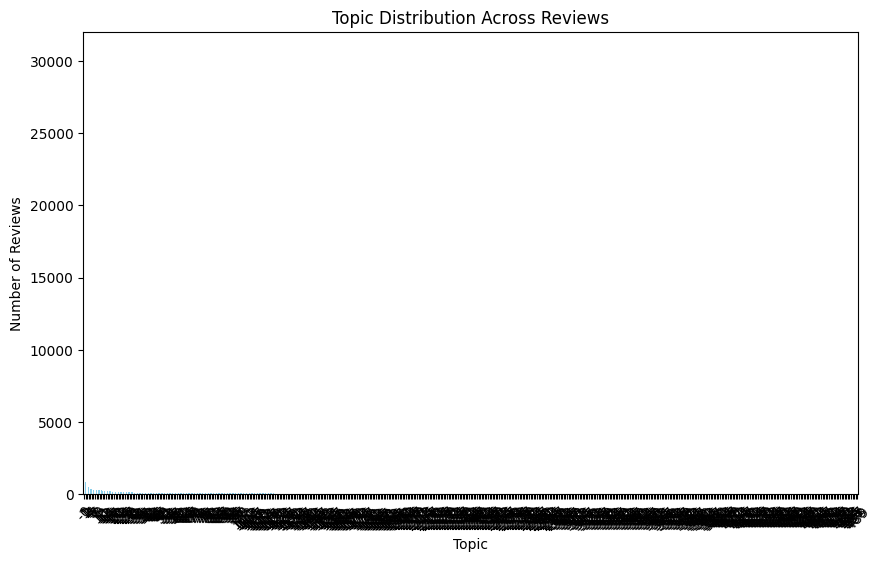

In [ ]:
# Explore Topics per Document
topics_overview = topic_model.get_document_info(data['cleaned_review'])
topics_overview['Topic'].value_counts().plot(kind='bar', color='skyblue', figsize=(10, 6))
plt.title('Topic Distribution Across Reviews')
plt.xlabel('Topic')
plt.ylabel('Number of Reviews')
plt.xticks(rotation=45)
plt.show()

In [ ]:
# Visualize topic distributions for individual documents
topic_model.visualize_distribution(probs)

In [ ]:
topic_model.visualize_topics()

In [ ]:
topic_model.visualize_hierarchy()

In [ ]:
# Evaluate and interpret the topics
topic_info = topic_model.get_topic_info()
print("Topic Information:\n", topic_info)

Topic Information:
      Topic  Count                                              Name  \
0       -1  30499                            -1_movie_film_like_bad   
1        0    838                              0_worst_seen_ive_bad   
2        1    601                     1_bollywood_indian_khan_india   
3        2    518                   2_horror_scary_scared_scarecrow   
4        3    346                         3_funny_laugh_joke_comedy   
..     ...    ...                                               ...   
486    485     10               485_cagney_busby_berkeley_footlight   
487    486     10                486_carrot_chairman_courtney_board   
488    487     10          487_goldsworthy_goldsworthys_andy_artist   
489    488     10                     488_howard_gay_kline_brackett   
490    489     10  489_governorgeneral_whitlam_dismissal_australian   

                                        Representation  \
0    [movie, film, like, bad, good, time, character...   
1    [worst